In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import os
import matplotlib

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 10000)


# Data Munging Section

In [2]:
path=r'C:\Users\jphil\OneDrive\Documents\Denver Traffic Accidents'

In [3]:
df=pd.read_csv(os.path.join(path, 'traffic_accidents_better.csv'), index_col=False)

df.head()

C:\Users\jphil\AppData\Local\Temp\ipykernel_25324\2386504662.py:1: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(os.path.join(path, 'traffic_accidents_better.csv'), index_col=False)


,object_id,incident_id,offense_id,offense_code,offense_code_extension,top_traffic_accident_offense,first_occurrence_date,last_occurrence_date,reported_date,incident_address,geo_x,geo_y,geo_lon,geo_lat,district_id,precinct_id,neighborhood_id,bicycle_ind,pedestrian_ind,HARMFUL_EVENT_SEQ_1,HARMFUL_EVENT_SEQ_2,HARMFUL_EVENT_SEQ_3,road_location,ROAD_DESCRIPTION,ROAD_CONTOUR,ROAD_CONDITION,LIGHT_CONDITION,TU1_VEHICLE_TYPE,TU1_TRAVEL_DIRECTION,TU1_VEHICLE_MOVEMENT,TU1_DRIVER_ACTION,TU1_DRIVER_HUMANCONTRIBFACTOR,TU1_PEDESTRIAN_ACTION,TU2_VEHICLE_TYPE,TU2_TRAVEL_DIRECTION,TU2_VEHICLE_MOVEMENT,TU2_DRIVER_ACTION,TU2_DRIVER_HUMANCONTRIBFACTOR,TU2_PEDESTRIAN_ACTION,SERIOUSLY_INJURED,FATALITIES,FATALITY_MODE_1,FATALITY_MODE_2,SERIOUSLY_INJURED_MODE_1,SERIOUSLY_INJURED_MODE_2,POINT_X,POINT_Y,x,y
0,204225496,202294304,20229430454410,5441,0,TRAF - ACCIDENT,2/24/2022 5:04:00 PM,2/24/2022 10:04:00 AM,2/24/2022 10:04:00 AM,I25 HWYNB / E HAMPDEN AVE,3163800.0,1663287.0,-104.918259,39.653079,3,324.0,Hampden South,0.0,0.0,Front to Rear,Front to Rear,Front to Rear,On Roadway,Non-Intersection,Straight - Level,Snowy W/Visible Icy Road Treatment,Daylight,Passenger Car/Passenger Van,North,Going Straight,Careless Driving,Distracted/Other Interior,NaN,SUV,North,Stopped in Traffic,No Contributing Action,No Apparent Contributing Factor,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.163800e+06,1.663287e+06
1,204225497,202294305,20229430554410,5441,0,TRAF - ACCIDENT,2/24/2022 5:04:00 PM,2/24/2022 10:04:00 AM,2/24/2022 10:04:00 AM,W LOUISIANA AVE / S SANTA FE DR,3142814.0,1677711.0,-104.992504,39.693022,3,313.0,Overland,0.0,0.0,Front to Side,NaN,Front to Side,On Roadway,At Intersection,Straight - Level,Snowy,Daylight,SUV,West,Making Right Turn,Disregarded Stop Sign,Looked/Did Not See,NaN,Pickup Truck/Utility Van,North,Going Straight,No Contributing Action,No Apparent Contributing Factor,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.142814e+06,1.677711e+06
2,204225498,202294316,20229431654010,5401,0,TRAF - ACCIDENT - HIT & RUN,2/24/2022 2:00:00 AM,2/23/2022 7:00:00 PM,2/24/2022 11:32:00 AM,8675 E EASTMAN AVE,3172318.0,1665379.0,-104.887958,39.658668,3,323.0,Hampden,0.0,0.0,Fence,NaN,Fence,On Private Property,Non-Intersection,NaN,Snowy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.172318e+06,1.665379e+06
3,204225499,202294318,20229431854410,5441,0,TRAF - ACCIDENT,2/24/2022 5:15:00 PM,2/24/2022 10:15:00 AM,2/24/2022 10:15:00 AM,I25 HWYSB / N SPEER BLVD,3137010.0,1700390.0,-105.012696,39.755367,1,121.0,Jefferson Park,0.0,0.0,Front to Rear,NaN,Front to Rear,On Roadway,Non-Intersection,Straight - Level,Dry,Daylight,Pickup Truck/Utility Van,South,Going Straight,Followed Too Closely,Driver Unfamiliar With Area,NaN,Passenger Car/Passenger Van,South,Stopped in Traffic,No Contributing Action,No Apparent Contributing Factor,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.137010e+06,1.700390e+06
4,204225500,2021313651,202131365154410,5441,0,TRAF - ACCIDENT,6/3/2021 7:15:00 PM,6/3/2021 12:15:00 PM,6/3/2021 12:32:00 PM,4535 N THOMPSON CT,3153009.0,1709307.0,-104.955603,39.779596,2,212.0,Elyria Swansea,0.0,0.0,Rear to Side,NaN,Rear to Side,On Private Property,Parking Lot,Straight - Level,Dry,Daylight,Pickup Truck/Utility Van,South,Backing,Improper Backing,Distracted/Other Interior,NaN,SUV,South,Parked,No Contributing Action,No Apparent Contributing Factor,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.153009e+06,1.709307e+06


In [5]:
df['incident_id'].nunique()

250990

In [6]:
print(df.drop_duplicates().shape)
print(df.shape)

(250999, 49)
(250999, 49)


## Checking duplicate rows per Incident ID

In [7]:
# Step 1: Identify Incident IDs that are duplicated
duplicate_incident_ids = df[df.duplicated('incident_id', keep=False)]['incident_id']

# Step 2: Filter the DataFrame to get only rows with these duplicated Incident IDs
duplicate_rows = df[df['incident_id'].isin(duplicate_incident_ids)]

duplicate_rows['incident_id'] = duplicate_rows['incident_id'].astype(str)

# Display the duplicate rows for examination
duplicate_rows[duplicate_rows['incident_id'] == '2020000000000.0'].head()
# duplicate_rows.drop_duplicates('Incident_Id')['Incident_Id'].head()

C:\Users\jphil\AppData\Local\Temp\ipykernel_14900\855111387.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplicate_rows['incident_id'] = duplicate_rows['incident_id'].astype(str)


,object_id,incident_id,offense_id,offense_code,offense_code_extension,top_traffic_accident_offense,first_occurrence_date,last_occurrence_date,reported_date,incident_address,geo_x,geo_y,geo_lon,geo_lat,district_id,precinct_id,neighborhood_id,bicycle_ind,pedestrian_ind,HARMFUL_EVENT_SEQ_1,HARMFUL_EVENT_SEQ_2,HARMFUL_EVENT_SEQ_3,road_location,ROAD_DESCRIPTION,ROAD_CONTOUR,ROAD_CONDITION,LIGHT_CONDITION,TU1_VEHICLE_TYPE,TU1_TRAVEL_DIRECTION,TU1_VEHICLE_MOVEMENT,TU1_DRIVER_ACTION,TU1_DRIVER_HUMANCONTRIBFACTOR,TU1_PEDESTRIAN_ACTION,TU2_VEHICLE_TYPE,TU2_TRAVEL_DIRECTION,TU2_VEHICLE_MOVEMENT,TU2_DRIVER_ACTION,TU2_DRIVER_HUMANCONTRIBFACTOR,TU2_PEDESTRIAN_ACTION,SERIOUSLY_INJURED,FATALITIES,FATALITY_MODE_1,FATALITY_MODE_2,SERIOUSLY_INJURED_MODE_1,SERIOUSLY_INJURED_MODE_2,POINT_X,POINT_Y,x,y


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250999 entries, 0 to 250998
Data columns (total 49 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   object_id                      250999 non-null  int64  
 1   incident_id                    250999 non-null  int64  
 2   offense_id                     250999 non-null  int64  
 3   offense_code                   250999 non-null  int64  
 4   offense_code_extension         250999 non-null  int64  
 5   top_traffic_accident_offense   250999 non-null  object 
 6   first_occurrence_date          250999 non-null  object 
 7   last_occurrence_date           155401 non-null  object 
 8   reported_date                  250999 non-null  object 
 9   incident_address               250999 non-null  object 
 10  geo_x                          241303 non-null  float64
 11  geo_y                          241303 non-null  float64
 12  geo_lon                       

In [10]:
pd.crosstab(df.FATALITIES, df.SERIOUSLY_INJURED, margins=True)

SERIOUSLY_INJURED,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,All
FATALITIES,,,,,,,,,
0.0,244126,4712,426,89,23,8,2,2,249388
1.0,451,71,21,9,2,2,0,0,556
2.0,17,7,3,1,1,0,0,0,29
3.0,0,0,1,0,0,0,0,0,1
All,244594,4790,451,99,26,10,2,2,249974


In [12]:
pd.crosstab(df.FATALITIES, df.LIGHT_CONDITION, margins=True)

LIGHT_CONDITION,,DARK-LIGHTED,DARK-UNLIGHTED,DAWN OR DUSK,DAY LIGHT,Dark-Lighted,Dark-Unlighted,Dawn or Dusk,Daylight,All
FATALITIES,,,,,,,,,,
0.0,6001,44603,4323,8265,138369,11754,1325,1630,32745,249015
1.0,1,229,23,24,186,47,5,1,40,556
2.0,0,13,0,0,7,6,0,1,2,29
3.0,0,1,0,0,0,0,0,0,0,1
All,6002,44846,4346,8289,138562,11807,1330,1632,32787,249601


In [13]:
df['fatality_injury']=df[['FATALITIES', 'SERIOUSLY_INJURED']].sum(axis=1)

In [15]:
df.loc[df['fatality_injury'] ==0, 'severity_flag']= 'None injured'

In [17]:
df.loc[(df['fatality_injury'] >0) &(df['fatality_injury'] ==2), 'severity_flag']= 'Some victims'

In [18]:
df.loc[df['fatality_injury'] >2, 'severity_flag']= 'Max victims'

In [19]:
df['severity_flag'].value_counts(dropna=False)

severity_flag
None injured    245151
NaN               5163
Some victims       514
Max victims        171
Name: count, dtype: int64

# Create a Heatmap of Fatalities or Serious Injuries

In [36]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Sample data loading
# df = pd.read_csv('your_data_file.csv')

# Assuming your DataFrame is named df and has the following columns:
# 'Geo_Lon', 'Geo_Lat', 'Seriously_Injured', 'Fatalities'

# Calculate the total number of serious injuries and fatalities per incident
df['Total_Injuries_Fatalities'] = df['Seriously_Injured'] + df['Fatalities']

# Remove rows with NaN values in the necessary columns
df_cleaned = df.dropna(subset=['Geo_Lat', 'Geo_Lon', 'Total_Injuries_Fatalities'])

# Create a base map
# Center the map around a specific latitude and longitude (e.g., center of the city)
city_center = [df_cleaned['Geo_Lat'].mean(), df_cleaned['Geo_Lon'].mean()]
base_map = folium.Map(location=city_center, zoom_start=12)

# Prepare data for the HeatMap
heat_data = df_cleaned[['Geo_Lat', 'Geo_Lon', 'Total_Injuries_Fatalities']].values.tolist()

# Add a heatmap to the base map
HeatMap(heat_data).add_to(base_map)

# Save the map to an HTML file
base_map.save('heatmap.html')

# To display the map in a Jupyter notebook
base_map


In [58]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Sample data loading
# df = pd.read_csv('your_data_file.csv')

# Assuming your DataFrame is named df and has the following columns:
# 'Geo_Lon', 'Geo_Lat', 'Seriously_Injured', 'Fatalities'

df_harvey_park = df[df['Neighborhood_Id'] == 'Harvey Park']

# Calculate the total number of serious injuries and fatalities per incident
df_harvey_park['Total_Injuries_Fatalities'] = df_harvey_park['Seriously_Injured'] + df_harvey_park['Fatalities']

# Remove rows with NaN values in the necessary columns
df_harvey_park_cleaned = df_harvey_park.dropna(subset=['Geo_Lat', 'Geo_Lon', 'Total_Injuries_Fatalities'])

# Create a base map
# Center the map around a specific latitude and longitude (e.g., center of the city)
city_center = [df_harvey_park_cleaned['Geo_Lat'].mean(), df_harvey_park_cleaned['Geo_Lon'].mean()]
base_map = folium.Map(location=city_center, zoom_start=12)

# Prepare data for the HeatMap
heat_data = df_harvey_park_cleaned[['Geo_Lat', 'Geo_Lon', 'Total_Injuries_Fatalities']].values.tolist()

# Add a heatmap to the base map
HeatMap(heat_data).add_to(base_map)

# Save the map to an HTML file
base_map.save('heatmap.html')

# To display the map in a Jupyter notebook
base_map


C:\Users\jphil\AppData\Local\Temp\ipykernel_19144\2674797862.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_harvey_park['Total_Injuries_Fatalities'] = df_harvey_park['Seriously_Injured'] + df_harvey_park['Fatalities']


In [59]:
df.Total_Injuries_Fatalities.describe()

count    217531.000000
mean          0.027463
std           0.193703
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           7.000000
Name: Total_Injuries_Fatalities, dtype: float64

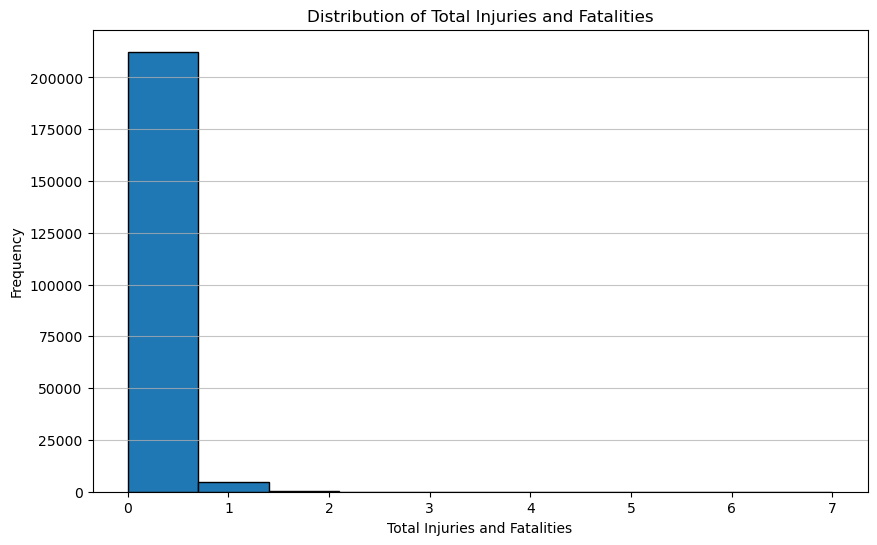

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample data loading
# df = pd.read_csv('your_data_file.csv')

# Assuming your DataFrame is named df and has the following columns:
# 'Geo_Lon', 'Geo_Lat', 'Seriously_Injured', 'Fatalities', 'Neighborhood_Id'

# Calculate the total number of serious injuries and fatalities per incident
df['Total_Injuries_Fatalities'] = df['Seriously_Injured'] + df['Fatalities']

# Remove rows with NaN values in the necessary columns
df_cleaned = df.dropna(subset=['Total_Injuries_Fatalities'])

# Create a histogram of Total_Injuries_Fatalities
plt.figure(figsize=(10, 6))
plt.hist(df_cleaned['Total_Injuries_Fatalities'], bins=10, edgecolor='black')
plt.title('Distribution of Total Injuries and Fatalities')
plt.xlabel('Total Injuries and Fatalities')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()


In [50]:
#which road location types were the most dangerous places for an accident?
# Group by Neighborhood_Id and aggregate
agg_df = df.groupby('Neighborhood_Id').agg({
    'Total_Injuries_Fatalities': ['mean', 'median', 'min', 'max']
}).reset_index()

# Flatten the MultiIndex columns
agg_df.columns = ['_'.join(col).strip() if type(col) is tuple else col for col in agg_df.columns]

# Sort by the 'Total_Injuries_Fatalities_mean' column
sorted_df = agg_df.sort_values('Total_Injuries_Fatalities_mean', ascending=False)

sorted_df

,Neighborhood_Id_,Total_Injuries_Fatalities_mean,Total_Injuries_Fatalities_median,Total_Injuries_Fatalities_min,Total_Injuries_Fatalities_max
35,Harvey Park,0.056129,0.0,0.0,6.0
36,Harvey Park South,0.055636,0.0,0.0,4.0
28,Fort Logan,0.050198,0.0,0.0,2.0
3,Barnum,0.047619,0.0,0.0,6.0
56,Skyland,0.046171,0.0,0.0,3.0
5,Bear Valley,0.043678,0.0,0.0,2.0
26,Field Not Entered,0.042909,0.0,0.0,4.0
46,Montbello,0.041383,0.0,0.0,4.0
76,Westwood,0.039259,0.0,0.0,3.0
19,College View - South Platte,0.038440,0.0,0.0,3.0


In [10]:
#seeing which vehicle types were usually involved in accidents
df.groupby('Tu1_Vehicle_Type').agg({'Seriously_Injured':['mean', 'min', 'max']})

Seriously_Injured          
                                                        mean  min  max
Tu1_Vehicle_Type                                                      
Bicycle                                             0.143243  0.0  2.0
Farm Equipment                                      0.000000  0.0  0.0
Field Not Entered                                   0.036157  0.0  2.0
Hit And Run Unknown                                 0.009273  0.0  3.0
Light Rail                                          0.000000  0.0  0.0
Motor Home                                          0.000000  0.0  0.0
Motorcycle                                          0.292135  0.0  2.0
Motorized Bicycle                                   0.175824  0.0  2.0
Non-School Bus                                      0.013986  0.0  2.0
Other                                               0.051131  0.0  2.0
Passenger Car/Passenger Van                         0.023213  0.0  6.0
Passenger Car/Passenger Van With Trailer            0.031792  0.0  2.0
Pending Investigation and/or Court Hearing          0.023634  0.0  6.0
Pickup Truck/Utility Van                            0.019781  0.0  4.0
Pickup Truck/Utility Van With Trailier              0.020040  0.0  3.0
SUV                                                 0.023161  0.0  7.0
SUV With Trailer                                    0.035714  0.0  5.0
School Bus                                          0.011236  0.0  3.0
Transit Bus                                         0.018161  0.0  2.0
Under Investigation                                      NaN  NaN  NaN
Unk                                                 0.000000  0.0  0.0
Vehicle OverLbs                                     0.013617  0.0  3.0

In [55]:
import folium
from folium.plugins import HeatMap
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample data loading
# df = pd.read_csv('your_data_file.csv')

# Assuming your DataFrame is named df and has the following columns:
# 'Geo_Lon', 'Geo_Lat', 'Seriously_Injured', 'Fatalities', 'Neighborhood_Id'

# Calculate the total number of serious injuries and fatalities per incident
df['Total_Injuries_Fatalities'] = df['Seriously_Injured'] + df['Fatalities']

# Remove rows with NaN values in the necessary columns
df_cleaned = df.dropna(subset=['Geo_Lat', 'Geo_Lon', 'Total_Injuries_Fatalities'])

# Create a base map
# Center the map around a specific latitude and longitude (e.g., center of the city)
city_center = [df_cleaned['Geo_Lat'].mean(), df_cleaned['Geo_Lon'].mean()]
base_map = folium.Map(location=city_center, zoom_start=12)

# Prepare data for the HeatMap
heat_data = df_cleaned[['Geo_Lat', 'Geo_Lon', 'Total_Injuries_Fatalities']].values.tolist()

# Add a heatmap to the base map
HeatMap(heat_data).add_to(base_map)

# Filter the DataFrame for rows where Neighborhood_Id is 'Harvey Park'
harvey_park_df = df_cleaned[df_cleaned['Neighborhood_Id'] == 'Harvey Park']

# Create a colormap
norm = plt.Normalize(harvey_park_df['Total_Injuries_Fatalities'].min(), harvey_park_df['Total_Injuries_Fatalities'].max())
cmap = plt.get_cmap('YlOrRd')

# Add markers for 'Harvey Park' incidents with colors based on the severity
for idx, row in harvey_park_df.iterrows():
    severity = row['Total_Injuries_Fatalities']
    color = cmap(norm(severity))
    color = matplotlib.colors.rgb2hex(color)
    folium.CircleMarker(
        location=[row['Geo_Lat'], row['Geo_Lon']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7
    ).add_to(base_map)

# Save the map to an HTML file
base_map.save('heatmap.html')

# To display the map in a Jupyter notebook
base_map


In [11]:
df.groupby('Tu2_Vehicle_Type').agg({'Seriously_Injured':['mean', 'min', 'max']})

Seriously_Injured          
                                                        mean  min  max
Tu2_Vehicle_Type                                                      
Bicycle                                             0.095054  0.0  2.0
Farm Equipment                                      0.000000  0.0  0.0
Field Not Entered                                   0.054237  0.0  4.0
Hit And Run Unknown                                 0.068522  0.0  1.0
Light Rail                                          0.013889  0.0  1.0
Motor Home                                          0.015152  0.0  1.0
Motorcycle                                          0.242136  0.0  2.0
Motorized Bicycle                                   0.164557  0.0  2.0
Non-School Bus                                      0.022642  0.0  1.0
Other                                               0.054902  0.0  5.0
Passenger Car/Passenger Van                         0.017276  0.0  7.0
Passenger Car/Passenger Van With Trailer            0.022333  0.0  3.0
Pending Investigation and/or Court Hearing          0.023634  0.0  6.0
Pickup Truck/Utility Van                            0.020508  0.0  5.0
Pickup Truck/Utility Van With Trailier              0.023880  0.0  3.0
SUV                                                 0.018617  0.0  7.0
SUV With Trailer                                    0.024845  0.0  1.0
School Bus                                          0.010638  0.0  2.0
Transit Bus                                         0.026981  0.0  2.0
Under Investigation                                      NaN  NaN  NaN
Vehicle OverLbs                                     0.023495  0.0  5.0

In [12]:
#Dark lighted and unlighted were the deadliest types of accidents- no surprise there
df.groupby('Light_Condition').agg({'Fatalities':['mean', 'min', 'max']})

Fatalities          
                                                 mean  min  max
Light_Condition                                                
Dark-Lighted                                 0.005770  0.0  3.0
Dark-Unlighted                               0.005280  0.0  1.0
Dawn Or Dusk                                 0.003012  0.0  1.0
Daylight                                     0.001434  0.0  2.0
Field Not Entered                            0.000000  0.0  0.0
Pending Investigation and/or Court Hearing   0.002483  0.0  2.0
Under Investigation                               NaN  NaN  NaN

In [13]:
#Making a list of the accident sites, which spots had the most accidents, and which spots were the most deadly

In [14]:
accident_and_death_prone= df.groupby(['Incident_Address', 'Geo_Lon', 'Geo_Lat']).agg({'Fatalities': 'sum', 'Incident_Address': 'count'})\
            .rename(columns={'Fatalities': 'Total_Fatalities', 'Incident_Address': 'Total_Accidents'})\
            .sort_values('Total_Accidents', ascending=False)

In [15]:
accident_and_death_prone['P&C loss index'] = (accident_and_death_prone['Total_Fatalities']+.1)*accident_and_death_prone['Total_Accidents']

In [16]:
accident_and_death_prone = accident_and_death_prone.sort_values('P&C loss index', ascending=False)
accident_and_death_prone.head(25)

,,,Total_Fatalities,Total_Accidents,P&C loss index
Incident_Address,Geo_Lon,Geo_Lat,,,
I70 Hwyeb / N Peoria St,-104.847037,39.774007,4.0,751,3079.1
I25 Hwynb / 20Th St,-105.004334,39.760949,4.0,634,2599.4
I70 Hwyeb / N Havana St,-104.865889,39.775633,3.0,469,1453.9
I25 Hwynb / W 6Th Ave,-105.013229,39.725677,1.0,1282,1410.2
I25 Hwynb / E Hampden Ave,-104.918259,39.653079,2.0,563,1182.3
I25 Hwynb / I225 Hwynb,-104.906738,39.634141,3.0,303,939.3
I70 Hwyeb / N Pecos St,-105.006426,39.783139,2.0,407,854.7
I70 Hwyeb / I225 Hwysb,-104.833835,39.772868,4.0,192,787.2
I70 Hwyeb / N Brighton Blvd,-104.967168,39.779882,2.0,358,751.8


In [17]:
from datetime import time

import matplotlib.pyplot as plt
import seaborn as sns

from glob import glob


<Axes: xlabel='count', ylabel='Tu1_Driver_Humancontribfactor'>

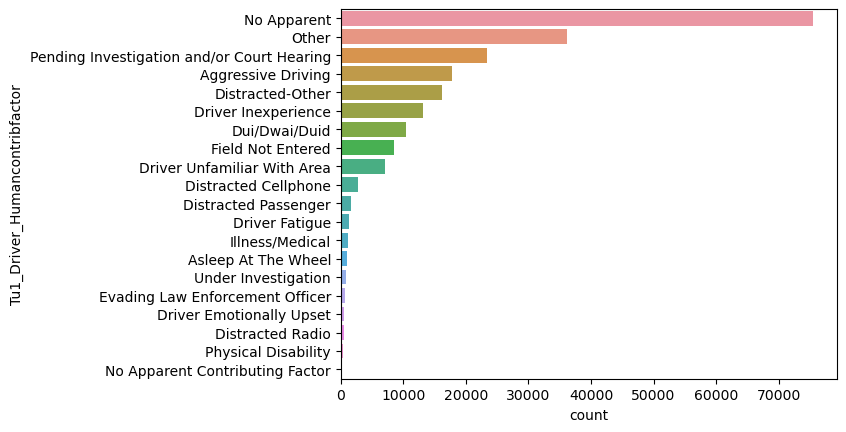

In [18]:
#graph showing top reasons for the accidents
order = df["Tu1_Driver_Humancontribfactor"].value_counts().index.tolist()
sns.countplot(y=df["Tu1_Driver_Humancontribfactor"], order=order)

C:\Users\jphil\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\jphil\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\jphil\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\jphil\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a len

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Traf - Accident - Hit & Run'),
  Text(1, 0, 'Traf - Accident'),
  Text(2, 0, 'Traf - Accident - DUI/DUID'),
  Text(3, 0, 'Traf - Accident - SBI'),
  Text(4, 0, 'Traf - Accident - Police'),
  Text(5, 0, 'Traf - Accident - Fatal'),
  Text(6, 0, 'Pending Investigation and/or Court Hearing')])

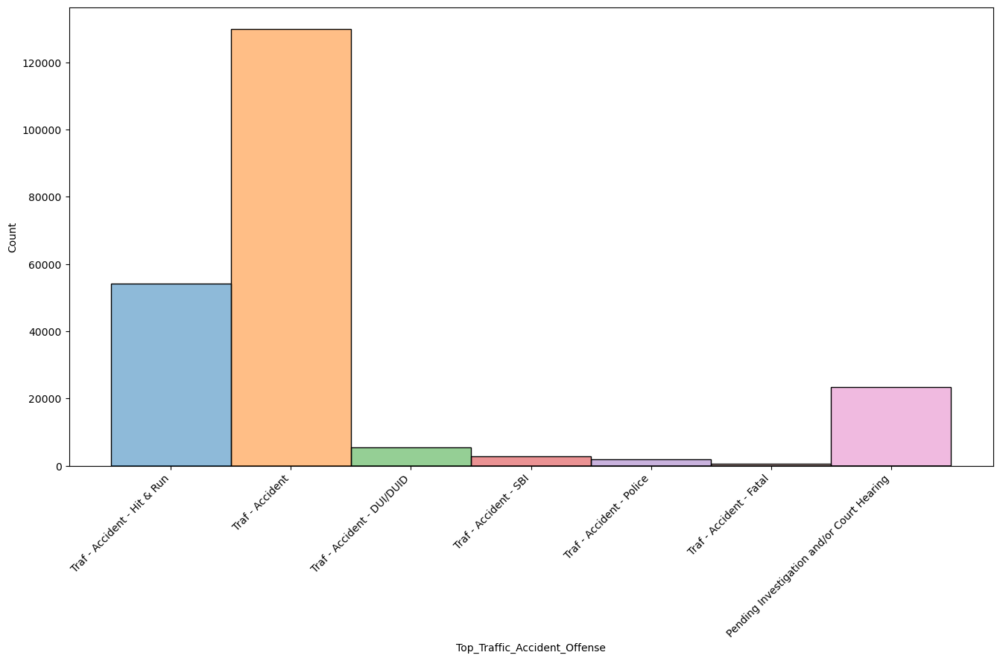

In [19]:
chart = plt.figure(figsize=(16,8))
sns.histplot(df, x="Top_Traffic_Accident_Offense", hue="Top_Traffic_Accident_Offense", legend=False)
plt.xticks(rotation=45, ha='right')

In [20]:
pip install folium pandas